# Predicting the Primary Genre Of Movies/TV-Shows using Plot Text

Everyone loves binge-watching their favorite Movies and TV Shows. Nowadays, movies can pull elements from multiple genres (e.g., action, adventure, comedy, etc.) through complex themes intertwined within a single plot. For example, a movie can be primarily an action movie while also containing undercurrents of romance and comedy (for example, Thor: Ragnarok, Thor: Love and Thunder). The majority of online platforms (e.g., IMDB, rotten tomatoes, etc.) that maintain movie/tv-shows details include all genres BUT do not specifically mention a "primary genre." We seek to tackle this problem today by using machine learning to classify any movie/tv-show with a single, primary genre that best represents the title's plot.

Highlighting a movie's primary genre can have many commercial applications, including improved content recommendation and increased precision in understanding various actors' performance and affinities per particular genres (and consequently, across niche fan bases).

As stated, we will use **machine learning** to **predict the primary genre** of movies/tv-shows. The majority of movies have a plot mentioned in a few lines of text that can be utilized for predicting target genres. This will be a **multi-label classification task** as we'll be predicting multiple genres per movie based on plot text. A simple **Logistic Regression** model was trained for this task. The dataset used for training the model is publicly available **CMU Movie Summary Corpus** dataset. The text of the plot is encoded using the **TF-IDF** text encoding method. The dataset was divided into train (90%) and test (10%) subsets. The evaluation metric used for performance evaluation was **F1-score**, which was **0.436** for test datasets which is quite a good score as we are able to recover the majority of genres. The model outputs probabilities for each genre, and we choose the genre with the highest probability as the "primary genre" of the particular movie/tv-show. The process's total code is present as a single class which can be run by simply initiating and calling the run() method.

In [ ]:
# Necessary for execution within Jupyter environment
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

### Fully Encapsulated Code

In [28]:
import pandas as pd
import numpy as np
import json
import nltk
import re
import csv
import gzip
import matplotlib.pyplot as plt 
import seaborn as sns
from tqdm import tqdm
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.multioutput import MultiOutputClassifier
from sklearn.metrics import f1_score


class PredictPrimaryGenre:
    
    def __init__(self, threshold = 0, file_name="PeerLogix Titles (IMDb Metadata).csv"):
        
        self.file_to_predict = file_name
        
        self.meta_file = "MovieSummaries/movie.metadata.tsv"
        self.plot_file = "MovieSummaries/plot_summaries.txt.gz"
        self.peerlogix_genres_file = "peerlogix_genres.csv"
        
        self.only_peerlogix_valid_genres = True
        
        self.valid_genres = [
            'Action', 'Action & Adventure', 'Adventure', 'Animation', 'Comedy', 'Crime', 'Documentary',
            'Drama', 'Family', 'Fantasy', 'Horror', 'Musical', 'Mystery', 'Romance', 'Science Fiction',
            'Thriller', 'War', ]

        self.valid_genres = pd.read_csv(self.peerlogix_genres_file).genre.unique().tolist() ## This one has around 8-10 more unique labels
        
        self.genre_corrections = {
                            'Action/Adventure' : 'Action & Adventure',
                            'Crime Fiction' : 'Crime',
                            'Family Film' : 'Family',
                            'Romance Film' : 'Romance',
                            'War Film' : 'War',
                            'Comedy Film' : 'Comedy'
                            }
        
        self.threshold = threshold 
        self.max_df = 0.8
        self.stop_words = "english"
        self.max_features = 50000
        
        print('Predictor Initialized.')
        
    
    def loadMetaData(self):
        self.meta = pd.read_csv(self.meta_file, sep = '\t', header = None)
        self.meta.columns = ["movie_id",1,"movie_name",3,4,5,6,7,"genre"]
        self.meta['movie_id'] = self.meta['movie_id'].astype(str)
        
        print("Loading of Meta Data Complete.")
        
    def loadMoviePlotsData(self):
        plots = []

        with gzip.open(self.plot_file, 'rt', encoding = 'UTF-8') as f:
            reader = csv.reader(f, dialect='excel-tab') 
            for row in tqdm(reader):
                plots.append(row)
                
        movie_id = []
        plot = []

        # extract movie Ids and plot summaries
        for i in tqdm(plots):
            movie_id.append(i[0])
            plot.append(i[1])

        # create dataframe
        self.movies = pd.DataFrame({'movie_id': movie_id, 'plot': plot})
        
        print("Loading of Movies Plot Data Complete.")
    
    def loadExistingPeerLogixGenres(self):
        existing_peerlogix_genres = pd.read_csv(self.peerlogix_genres_file)
        existing_peerlogix_genres = existing_peerlogix_genres.groupby("imdb_id").aggregate(lambda x: list(x)).reset_index()
        self.existing_peerlogix_genres = dict(zip(existing_peerlogix_genres["imdb_id"].values.tolist(), existing_peerlogix_genres["genre"].values.tolist()))
        
        print("Loading of Existing PeerLogix Genres Complete.")
        
    def mergeMovieAndPlotsData(self):
        self.movies = pd.merge(self.movies, self.meta[['movie_id', 'movie_name', 'genre']], on = 'movie_id')
        
        print("Merging of Genre and Plots Data Complete.")
        
    def cleanGenreData(self):
        genres = [] 

        for i in self.movies['genre']: 
            movie_genres = list(json.loads(i).values())

            movie_genres = [self.genre_corrections.get(genre, genre) for genre in movie_genres] ## Genre Correction in Data

            if self.only_peerlogix_valid_genres: ## Keep only peerlgix valid genres
                movie_genres = [genre for genre in movie_genres if genre in self.valid_genres]

            genres.append(movie_genres) 

        self.movies['genre_new'] = genres
    
        print("Cleaning of Genre Data Complete.")
    
    def cleanPlotData(self):
        self.movies['clean_plot'] = self.movies['plot'].apply(lambda x: " ".join(re.findall("[a-zA-Z]+", x.lower())))
        
        print("Cleaning of Plots Data Complete.")
        
    def LoadPeerLogixFileToPredictPrimaryGenre(self):
        self.peerlogix = pd.read_csv(self.file_to_predict)
        
        print("Loading of Prediction File Complete.")
    
    def LoadAndCleanData(self):
        self.loadMetaData()
        self.loadMoviePlotsData()
        self.loadExistingPeerLogixGenres()
        self.mergeMovieAndPlotsData()
        self.cleanGenreData()
        self.cleanPlotData()
        self.LoadPeerLogixFileToPredictPrimaryGenre()
        
    def PrepareMultiLabelTargetValues(self):
        self.multilabel_binarizer = MultiLabelBinarizer()
        self.multilabel_binarizer.fit(self.movies['genre_new'])

        # transform target variable
        self.Y = self.multilabel_binarizer.transform(self.movies['genre_new'])
        
        print("Preparation of Multi-Label Target Complete.")
    
    def PrepareTrainTestSplit(self):
        self.X_train, self.X_test, self.Y_train, self.Y_test = train_test_split(self.movies['clean_plot'], self.Y, test_size=0.1, random_state=123)
        
        print("Train Test Split Complete.")
        
    def TransformPlotsFromTextToFloats(self):
        self.tfidf_vectorizer = TfidfVectorizer(max_df=self.max_df, stop_words=self.stop_words, max_features=self.max_features)
        
        self.X_train_tfidf = self.tfidf_vectorizer.fit_transform(self.X_train)
        self.X_test_tfidf = self.tfidf_vectorizer.transform(self.X_test)
        
        print("Text Data Vectorization Complete.")
        
    def PrepreDataForMLModel(self):
        self.PrepareMultiLabelTargetValues()
        self.PrepareTrainTestSplit()
        self.TransformPlotsFromTextToFloats()
        
        
    def TrainClassifier(self):
        lr = LogisticRegression(max_iter=500)
        self.clf = OneVsRestClassifier(lr)

        self.clf.fit(self.X_train_tfidf, self.Y_train)
        
    def EvaluateClassifier(self):
        Y_test_pred = self.clf.predict(self.X_test_tfidf)
        print("F1-Score : {:.3f}".format(f1_score(self.Y_test, Y_test_pred, average="micro")))
        
    def PredictGenre(self, text):
        if isinstance(text, str):
            cleaned_text = " ".join(re.findall("[a-zA-Z]+", text.lower()))
            X = self.tfidf_vectorizer.transform([cleaned_text])
            probs = self.clf.predict_proba(X) ## Probabilities/ liklihood

            # Isolate highest probable genre
            primary_genre_idx = probs.argsort()[0][-1] ## Taking highest probability/liklihood
            idx2, idx3, idx4, idx5 = probs.argsort()[0][-2], probs.argsort()[0][-3], probs.argsort()[0][-4], probs.argsort()[0][-5]

            # Discard results if none were above threshold 
            if probs[0][primary_genre_idx] < self.threshold:
                return ["NA", ] * 5

            # Else, return top genre
            primary_genre = self.multilabel_binarizer.classes_[primary_genre_idx] 
            genre2, genre3, genre4, genre5 = self.multilabel_binarizer.classes_[idx2], self.multilabel_binarizer.classes_[idx3], self.multilabel_binarizer.classes_[idx4], self.multilabel_binarizer.classes_[idx5]

            primary_genre = self.genre_corrections.get(primary_genre, primary_genre)
            genre2, genre3, genre4, genre5 = self.genre_corrections.get(genre2, genre2), self.genre_corrections.get(genre3, genre3), self.genre_corrections.get(genre4, genre4), self.genre_corrections.get(genre5, genre5)
            return primary_genre, genre2, genre3, genre4, genre5
        else:
            return ["NA", ] * 5    
    
    def PredictGenreForFile(self):
        primary_genre = []

        for i, (imdb_id, plot) in enumerate(self.peerlogix[["imdb_id","description"]].values):
            existing_genres = self.existing_peerlogix_genres.get(imdb_id, []) ## Retrieve Existing Genres for id
            predicted_genres = self.PredictGenre(plot) ## Make Prediction on Plot

            if existing_genres: ## If Genres present for IMDB ID then choose from it else append predicted one.
                if len(existing_genres) == 1: ## If single Genre then it'll be primary Genre
                    primary_genre.append(existing_genres[0])
                else:
                    selected_genre = None
                    for genre in predicted_genres: ### Check for predicted Genre in existing Genres
                        if genre in existing_genres:
                            selected_genre = genre
                            break    
                    primary_genre.append(selected_genre if selected_genre else "NA") 

            else:
                primary_genre.append(predicted_genres[0]) ## Append first one which is primary

            if (i+1)%5000 == 0:
                print("{} iteration completed".format(i+1))
        
        self.peerlogix["Primary_Genre1"] = primary_genre
    
    def RunPredictor(self):
        
        # Download the training data
        self.LoadAndCleanData()
        self.PrepreDataForMLModel()
        
        print("\n=========== Data Loading and Cleaning Complete =============\n")
        
        # train the classifier
        self.TrainClassifier()
        self.EvaluateClassifier()
        
        print("\n=========== Model Training and Evaluation Complete =============\n")
        
        # Loop through each and choose primary genre 
        self.PredictGenreForFile()
        
        print("\n=========== Prediction of Genre Complete =============\n")
        
        # Save CSV locally 
        self.peerlogix.to_csv("file_with_genre.csv")
        
        return self.peerlogix

In [29]:
%%time

genre_predictor = PredictPrimaryGenre()

df = genre_predictor.RunPredictor()

df.head()

Predictor Initialized.


4543it [00:00, 45423.44it/s]

Loading of Meta Data Complete.


42303it [00:00, 43964.15it/s]
100%|███████████████████████████████████████████████████████████████████████| 42303/42303 [00:00<00:00, 1763120.61it/s]


Loading of Movies Plot Data Complete.
Loading of Existing PeerLogix Genres Complete.
Merging of Genre and Plots Data Complete.
Cleaning of Genre Data Complete.
Cleaning of Plots Data Complete.
Loading of Prediction File Complete.
Preparation of Multi-Label Target Complete.
Train Test Split Complete.
Text Data Vectorization Complete.

=========== Data Loading and Cleaning Complete =============

F1-Score : 0.436

=========== Model Training and Evaluation Complete =============

5000 iteration completed
10000 iteration completed
15000 iteration completed
20000 iteration completed
25000 iteration completed
30000 iteration completed
35000 iteration completed
40000 iteration completed
45000 iteration completed
50000 iteration completed

=========== Prediction of Genre Complete =============

Wall time: 2min 12s


,imdb_id,poster_url,trailer_url,release_year,description,imdb_score,rating,genres,Primary_Genre1
0,tt0068817,https://m.media-amazon.com/images/M/MV5BYzk2Mj...,-VBLDluFlnQ,1972,Ogami Itto volunteers to be tortured by the ya...,7.5,R,"['Drama', 'Action']",Action
1,tt0069047,https://m.media-amazon.com/images/M/MV5BODM3MD...,iquHLv-Usrg,1973,A busload of tourists stops in to visit a smal...,4.8,R,['Horror'],Horror
2,tt0385990,https://m.media-amazon.com/images/M/MV5BZTZkYT...,1JusFfwHSgM,2004,Two time travelers with opposing views are sen...,3.1,R,"['Action', 'Science Fiction']",Science Fiction
3,tt1686768,https://m.media-amazon.com/images/M/MV5BODM1MD...,tSIbHII-N44,2011,An English teacher brings soccer from England ...,6.8,NaN,['Drama'],Drama
4,tt2655470,https://m.media-amazon.com/images/M/MV5BMjE5Nz...,l7PKbUab0Xs,2013–2014,"Centers on Terry Gannon, a recently divorced s...",6.4,NaN,"['Comedy', 'Family']",Comedy


In [99]:
from PIL import Image, ImageFont, ImageDraw
from IPython. display import display
import requests
import numpy as np
import matplotlib.pyplot as plt
import textwrap

%matplotlib inline

In [100]:
## Rerun this cell if it fails with URL related error as some ids don't have URLs

imdb_ids = genre_predictor.peerlogix.sample(6).imdb_id.values

genres_l, urls, plots, imgs, p_genres = [], [], [], [], []
for imdb_id in imdb_ids:
    genres = genre_predictor.existing_peerlogix_genres[imdb_id]
    poster_url = genre_predictor.peerlogix[genre_predictor.peerlogix.imdb_id== imdb_id].poster_url.values[0]
    plot = genre_predictor.peerlogix[genre_predictor.peerlogix.imdb_id== imdb_id].description.values[0]
    img = Image.open(requests.get(poster_url, stream=True).raw)
    predicted_genres = list(genre_predictor.PredictGenre(plot))
    
    genres_l.append(genres)
    urls.append(poster_url)
    plots.append(plot)
    imgs.append(img)
    p_genres.append(predicted_genres)

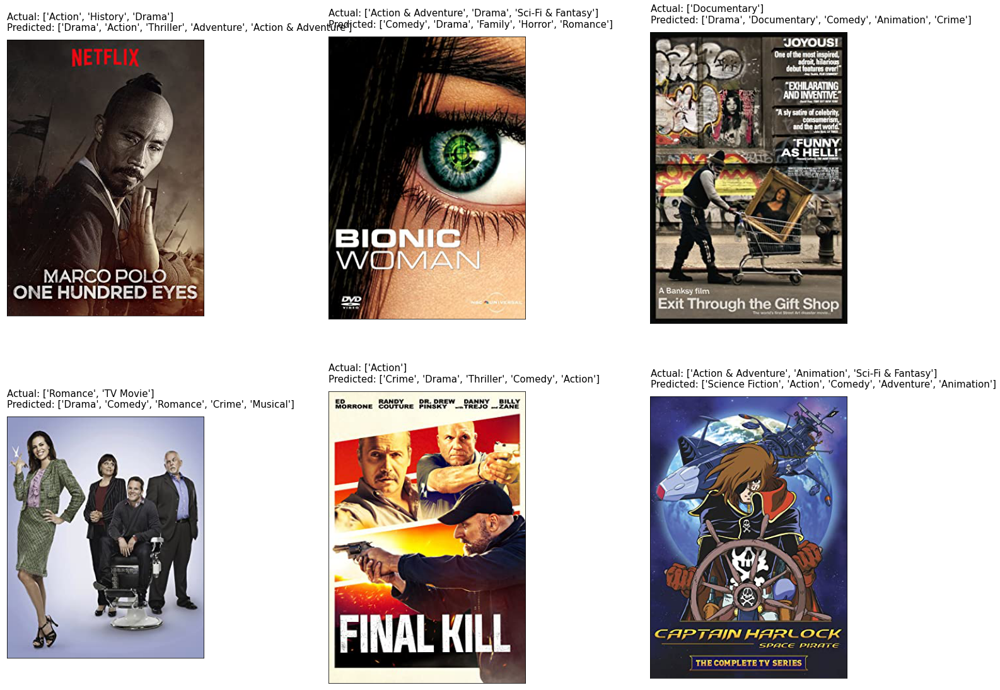

In [101]:
fig = plt.figure(figsize=(22,16))

for i in range(6):
    ax = fig.add_subplot(2,3,i+1)

    ax.imshow(imgs[i]);
    ax.text(0,0, "Actual: {}\nPredicted: {}\n".format(genres_l[i], p_genres[i]), fontdict={"fontsize": 15}, ha="left", wrap=True);
    ax.set_xticks([],[]);ax.set_yticks([],[]);
    
plt.tight_layout()

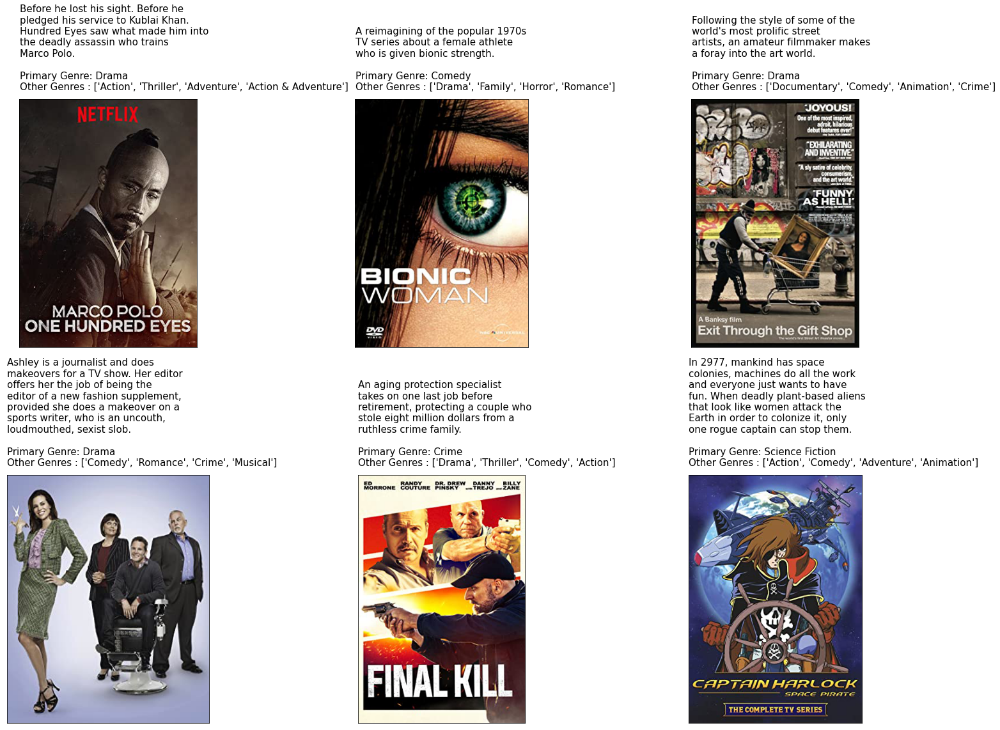

In [102]:
fig = plt.figure(figsize=(22,16))

for i in range(6):
    ax = fig.add_subplot(2,3,i+1)

    ax.imshow(imgs[i]);
    ax.text(0,0, "{}\n\nPrimary Genre: {}\nOther Genres : {}\n".format("\n".join(textwrap.wrap(plots[i], width=35)), p_genres[i][0], p_genres[i][1:]), 
            fontdict={"fontsize": 15},
            ha="left", 
            wrap=True);
    
    ax.set_xticks([],[]);ax.set_yticks([],[]);
    
plt.tight_layout()

In [103]:
vectorized_arr = genre_predictor.tfidf_vectorizer.transform(plots[:1])
probs = genre_predictor.clf.predict_proba(vectorized_arr)
probs_idxs = probs.argsort()[0][::-1]

cats = genre_predictor.multilabel_binarizer.classes_[probs_idxs]
ordered_probs = probs[0][probs_idxs]

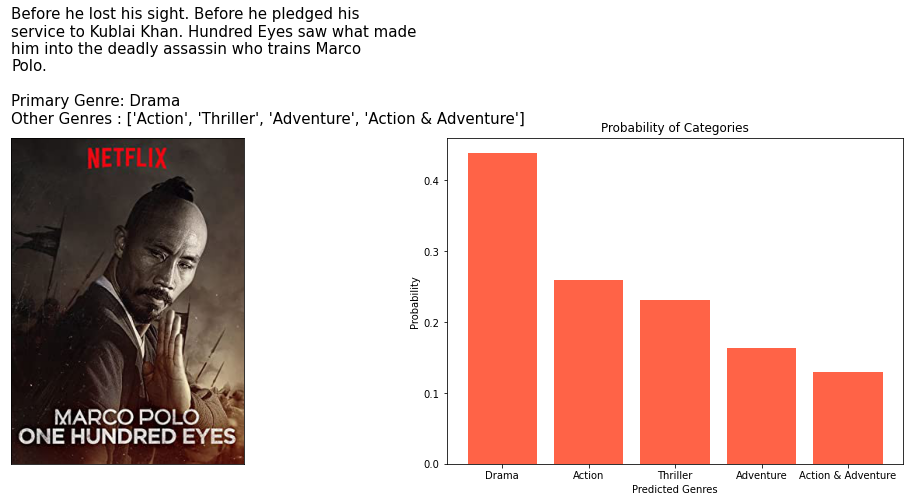

In [104]:
fig = plt.figure(figsize=(18, 6))

ax1 = fig.add_subplot(121)
ax1.imshow(imgs[0])
ax1.text(0,0, "{}\n\nPrimary Genre: {}\nOther Genres : {}\n".format("\n".join(textwrap.wrap(plots[0], width=50)), p_genres[0][0], p_genres[0][1:]), 
            fontdict={"fontsize": 15},
            ha="left", 
            wrap=True);
    
ax1.set_xticks([],[]);ax1.set_yticks([],[]);

ax2 = fig.add_subplot(122)
ax2.bar(x=cats[:5], height=ordered_probs[:5], color="tomato");
ax2.set_ylabel("Probability");
ax2.set_xlabel("Predicted Genres");
ax2.set_title("Probability of Categories");

In [105]:
vectorized_arr = genre_predictor.tfidf_vectorizer.transform(plots[1:2])
probs = genre_predictor.clf.predict_proba(vectorized_arr)
probs_idxs = probs.argsort()[0][::-1]

cats = genre_predictor.multilabel_binarizer.classes_[probs_idxs]
ordered_probs = probs[0][probs_idxs]

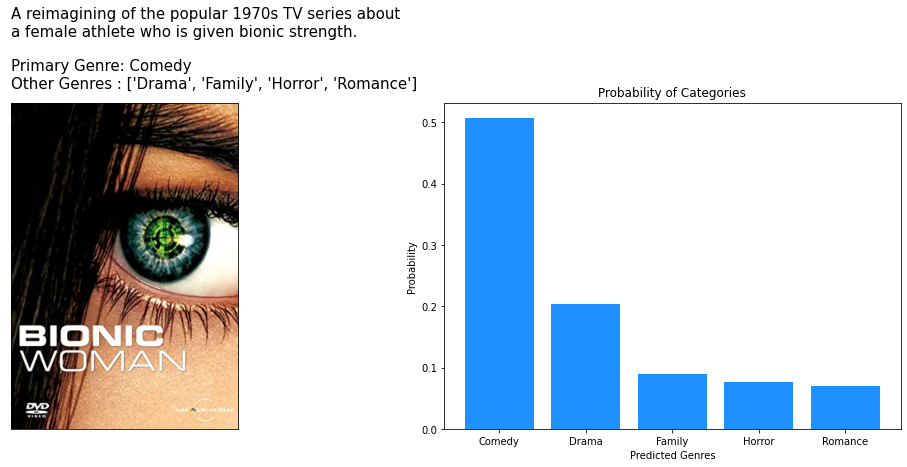

In [106]:
fig = plt.figure(figsize=(18, 6))

ax1 = fig.add_subplot(121)
ax1.imshow(imgs[1])
ax1.text(0,0, "{}\n\nPrimary Genre: {}\nOther Genres : {}\n".format("\n".join(textwrap.wrap(plots[1], width=50)), p_genres[1][0], p_genres[1][1:]), 
            fontdict={"fontsize": 15},
            ha="left", 
            wrap=True);
    
ax1.set_xticks([],[]);ax1.set_yticks([],[]);

ax2 = fig.add_subplot(122)
ax2.bar(x=cats[:5], height=ordered_probs[:5], color="dodgerblue");
ax2.set_ylabel("Probability");
ax2.set_xlabel("Predicted Genres");
ax2.set_title("Probability of Categories");

In [107]:
vectorized_arr = genre_predictor.tfidf_vectorizer.transform(plots[2:3])
probs = genre_predictor.clf.predict_proba(vectorized_arr)
probs_idxs = probs.argsort()[0][::-1]

cats = genre_predictor.multilabel_binarizer.classes_[probs_idxs]
ordered_probs = probs[0][probs_idxs]

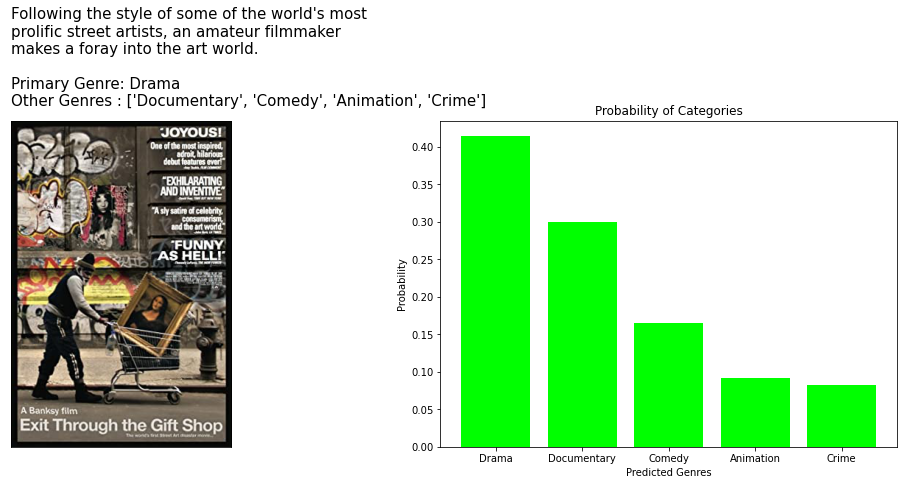

In [108]:
fig = plt.figure(figsize=(18, 6))

ax1 = fig.add_subplot(121)
ax1.imshow(imgs[2])
ax1.text(0,0, "{}\n\nPrimary Genre: {}\nOther Genres : {}\n".format("\n".join(textwrap.wrap(plots[2], width=50)), p_genres[2][0], p_genres[2][1:]), 
            fontdict={"fontsize": 15},
            ha="left", 
            wrap=True);
    
ax1.set_xticks([],[]);ax1.set_yticks([],[]);

ax2 = fig.add_subplot(122)
ax2.bar(x=cats[:5], height=ordered_probs[:5], color="lime");
ax2.set_ylabel("Probability");
ax2.set_xlabel("Predicted Genres");
ax2.set_title("Probability of Categories");

In [109]:
vectorized_arr = genre_predictor.tfidf_vectorizer.transform(plots[3:4])
probs = genre_predictor.clf.predict_proba(vectorized_arr)
probs_idxs = probs.argsort()[0][::-1]

cats = genre_predictor.multilabel_binarizer.classes_[probs_idxs]
ordered_probs = probs[0][probs_idxs]

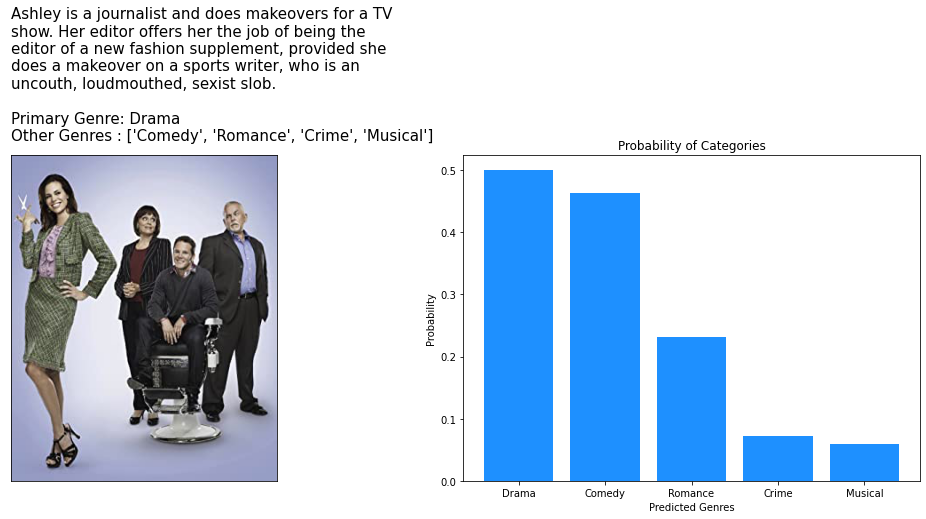

In [110]:
fig = plt.figure(figsize=(18, 6))

ax1 = fig.add_subplot(121)
ax1.imshow(imgs[3])
ax1.text(0,0, "{}\n\nPrimary Genre: {}\nOther Genres : {}\n".format("\n".join(textwrap.wrap(plots[3], width=50)), p_genres[3][0], p_genres[3][1:]), 
            fontdict={"fontsize": 15},
            ha="left", 
            wrap=True);
    
ax1.set_xticks([],[]);ax1.set_yticks([],[]);

ax2 = fig.add_subplot(122)
ax2.bar(x=cats[:5], height=ordered_probs[:5], color="dodgerblue");
ax2.set_ylabel("Probability");
ax2.set_xlabel("Predicted Genres");
ax2.set_title("Probability of Categories");

In [111]:
vectorized_arr = genre_predictor.tfidf_vectorizer.transform(plots[4:5])
probs = genre_predictor.clf.predict_proba(vectorized_arr)
probs_idxs = probs.argsort()[0][::-1]

cats = genre_predictor.multilabel_binarizer.classes_[probs_idxs]
ordered_probs = probs[0][probs_idxs]

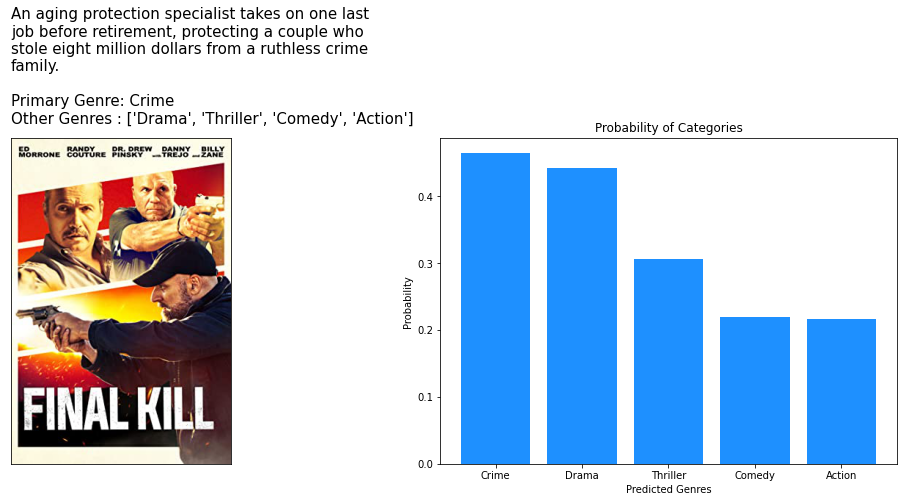

In [112]:
fig = plt.figure(figsize=(18, 6))

ax1 = fig.add_subplot(121)
ax1.imshow(imgs[4])
ax1.text(0,0, "{}\n\nPrimary Genre: {}\nOther Genres : {}\n".format("\n".join(textwrap.wrap(plots[4], width=50)), p_genres[4][0], p_genres[4][1:]), 
            fontdict={"fontsize": 15},
            ha="left", 
            wrap=True);
    
ax1.set_xticks([],[]);ax1.set_yticks([],[]);

ax2 = fig.add_subplot(122)
ax2.bar(x=cats[:5], height=ordered_probs[:5], color="dodgerblue");
ax2.set_ylabel("Probability");
ax2.set_xlabel("Predicted Genres");
ax2.set_title("Probability of Categories");

In [113]:
vectorized_arr = genre_predictor.tfidf_vectorizer.transform(plots[5:])
probs = genre_predictor.clf.predict_proba(vectorized_arr)
probs_idxs = probs.argsort()[0][::-1]

cats = genre_predictor.multilabel_binarizer.classes_[probs_idxs]
ordered_probs = probs[0][probs_idxs]

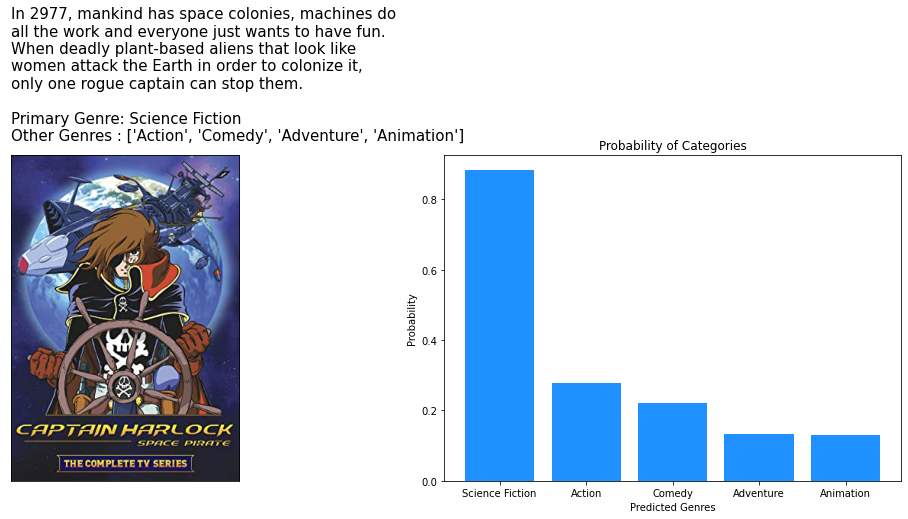

In [114]:
fig = plt.figure(figsize=(18, 6))

ax1 = fig.add_subplot(121)
ax1.imshow(imgs[5])
ax1.text(0,0, "{}\n\nPrimary Genre: {}\nOther Genres : {}\n".format("\n".join(textwrap.wrap(plots[5], width=50)), p_genres[5][0], p_genres[5][1:]), 
            fontdict={"fontsize": 15},
            ha="left", 
            wrap=True);
    
ax1.set_xticks([],[]);ax1.set_yticks([],[]);

ax2 = fig.add_subplot(122)
ax2.bar(x=cats[:5], height=ordered_probs[:5], color="dodgerblue");
ax2.set_ylabel("Probability");
ax2.set_xlabel("Predicted Genres");
ax2.set_title("Probability of Categories");

In [115]:
from lime import lime_text

classes = genre_predictor.multilabel_binarizer.classes_.tolist()
explainer = lime_text.LimeTextExplainer(class_names=classes, verbose=True)

def make_predictions(X_batch_text):
    X_batch = genre_predictor.tfidf_vectorizer.transform(X_batch_text)
    preds = genre_predictor.clf.predict_proba(X_batch)
    return preds    

In [116]:
idx = 0

explanation = explainer.explain_instance(plots[idx],
                                         classifier_fn=make_predictions,
                                         labels=[classes.index(p_genres[idx][0])], num_features=15)
explanation.show_in_notebook()

Intercept 0.38945268476785766
Prediction_local [0.44010256]
Right: 0.4383926379371121


In [117]:
idx = 1

explanation = explainer.explain_instance(plots[idx],
                                         classifier_fn=make_predictions,
                                         labels=[classes.index(p_genres[idx][0])], num_features=15)
explanation.show_in_notebook()

Intercept 0.32262909507422033
Prediction_local [0.51116631]
Right: 0.5068002388117296


In [118]:
idx = 2

explanation = explainer.explain_instance(plots[idx],
                                         classifier_fn=make_predictions,
                                         labels=[classes.index(p_genres[idx][0])], num_features=15)
explanation.show_in_notebook()

Intercept 0.3843447067267544
Prediction_local [0.41522489]
Right: 0.4142820642735225


In [119]:
idx = 3

explanation = explainer.explain_instance(plots[idx],
                                         classifier_fn=make_predictions,
                                         labels=[classes.index(p_genres[idx][0])], num_features=15)
explanation.show_in_notebook()

Intercept 0.4247200702125129
Prediction_local [0.5014261]
Right: 0.5000788252781079


In [120]:
idx = 4

explanation = explainer.explain_instance(plots[idx],
                                         classifier_fn=make_predictions,
                                         labels=[classes.index(p_genres[idx][0])], num_features=15)
explanation.show_in_notebook()

Intercept 0.1901871046161644
Prediction_local [0.46868252]
Right: 0.463901037566761


In [121]:
idx = 5

explanation = explainer.explain_instance(plots[idx],
                                         classifier_fn=make_predictions,
                                         labels=[classes.index(p_genres[idx][0])], num_features=15)
explanation.show_in_notebook()

Intercept 0.24114460283129968
Prediction_local [0.9085151]
Right: 0.8822402635103923
